# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 13.03.2021

Мягкий дедлайн: 28.03.2021 01:59 MSK

Жёсткий дедлайн: 01.04.2021 01:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



In [200]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

Главным выводом для меня стало то, что за домашнее задание надо садиться сразу же по выдаче. Откладывая его на потом и занимаясь другими делами, я осознал свою полную беспомощность, когда сел за него очень поздно. Мимолётно увиденные переживания по поводу способов решения заданий от людей, которых я считаю на уровень умнее себя, окончательно отбивали какое-либо желание попытаться сделать это всё самому. Но вроде бы я попытался подбить первую часть и даже вышло что-то хотя бы отдалённо напоминающее верную логику.

Также раньше я думал, что знаю статистику хорошо. Но нет, ЕМ-алгоритм заставил меня полностью поплыть в этой теме, потому что я не понял, как нам нужно было использовать найденные логарифмы правдоподобия и нижнюю оценку в обучении. После этой домашки я осознал всю тяжесть ситуации, в которую себя загнал плохой подготовкой первых двух домашек, тысячу раз пожалел о невозможности отписаться от курса (хоть мы здесь и проходим самые интересные темы, которые вообще есть в моём пуле дисциплин этого полугодия) и вообще разочаровался в себе.

Надеюсь, что новая домашка станет первым шагом на пути к желанному зачёту по курсу, потому что идти на свою первую пересдачу в жизни очень не хочется (а платить иуп тем более)...

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [201]:
from numpy import linalg as LA
X = np.array([[1,2,0], [3, 4, 5], [7, -8, 9]])
D = np.diag(np.sum(X, axis=1))
L = D - X
v, w = LA.eig(L)
asc_index = np.argsort(v)
w = w[:, asc_index].real
w

array([[-0.57735027, -0.22402597, -0.22402597],
       [-0.57735027,  0.34415584,  0.34415584],
       [-0.57735027,  0.78571429,  0.78571429]])

In [202]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        X=W
        return: (n_samples, n_components) - eigenvectors
        '''
        D = np.diag(np.sum(X, axis=1))
        L = D - X
        eigenvalues, eigenvectors = LA.eig(L)
        asc_index = np.argsort(eigenvalues)
        eigenvectors = eigenvectors[:, asc_index]
        return eigenvectors[:, :self.n_components].real

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [203]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [204]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [205]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
map

# Черновые вычисления

In [206]:
routes_set = list(set(';'.join(data['RouteNumbers_en'].to_numpy()).replace(" ", "").split(';')))

In [207]:
routes = dict.fromkeys(routes_set, [])
routes_copy = {}
for j in range(len(routes_set)):
  routes_copy[routes_set[j]]=[]
  for i in range(len(data)):
    if routes_set[j] in str(data['RouteNumbers_en'][i]):
     routes_copy[routes_set[j]].append(data['index'][i])
     routes.update(routes_copy)

In [208]:
len(routes)

163

Определим расстояние между объектами на московской широте

In [209]:
pre_coord = []
for i in range(len(data)):
    pre_coord.append([data['Latitude_WGS84_en'][i], data['Longitude_WGS84_en'][i]])
coord = np.array(pre_coord)

In [210]:
from sklearn.metrics.pairwise import haversine_distances
from math import radians
coord_in_radians = [0]*coord.shape[0]
for index in range(coord.shape[0]):
  coord_in_radians[index] = [radians(_) for _ in coord[index]]

distance_stops = haversine_distances(np.array(coord_in_radians))* 6371000/1000  # multiply by Earth radius to get kilometers

Теперь нужно понять как сделать из полной матрицы расстояний матрицу расстояний для каждого отдельно взятого маршрута.
1. Создаём бинарный вектор наличия конкретной остановки в маршруте для каждого маршрута
2. Создаём матрицу расстояний для каждого маршрута, умножая исходную матрицу расстояний на наш бинарный вектор.

In [211]:
stop_in_rout = np.zeros((len(data), len(routes)), dtype=int)
for i in range(len(data)):
  for j in range(len(routes)):
    if str(data['index'][i]) in str(routes[routes_set[j]]):
      stop_in_rout[i, j] = 1


In [212]:
dist_matrix = [0]*len(routes)
for i in range(len(routes)):
  dist_matrix[i] = (distance_stops * stop_in_rout.T[i]).T * stop_in_rout.T[i]

Теперь отсортируем остановки маршрута:

In [213]:
index_of_previous_stop = dict.fromkeys(routes_set, [])
index_of_previous_stop_copy = {}
sorted_routes = dict.fromkeys(routes_set, [])
sorted_routes_copy = {}

for i in range(len(routes_set)):
     index_of_previous_stop_copy[routes_set[i]]=[]
     sorted_routes_copy[routes_set[i]]=[]
     index_of_previous_stop_copy[routes_set[i]].append(np.argmax(np.sum(dist_matrix[i], axis=0)))
     index_of_previous_stop.update(index_of_previous_stop_copy)
     sorted_routes_copy[routes_set[i]].append(int(data['index'].iloc[index_of_previous_stop_copy[routes_set[i]]]))
     sorted_routes.update(sorted_routes_copy)

In [214]:
index_of_previous_stop_copy[routes_set[1]]

[35]

In [215]:
for i in range(len(routes_set)):
  for j in range(len(routes[routes_set[i]])-1):
      try:
        index_of_previous_stop_copy[routes_set[i]].append(np.where(dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j]]==np.min(dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j]][np.nonzero(dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j]])]))[0][0])
        index_of_previous_stop.update(index_of_previous_stop_copy)
        sorted_routes_copy[routes_set[i]].append(data['index'].iloc[index_of_previous_stop_copy[routes_set[i]][j+1]])
        sorted_routes.update(sorted_routes_copy)
        dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j+1]]=np.zeros_like(dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j+1]], dtype=int)*0
      except ValueError:  #raised if `dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j]]` is empty.
        pass
      except IndexError:
        pass

# Возвращение к заданию 1

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [216]:
def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''
    dirty_routes = data['RouteNumbers_en'].to_numpy()
    clear_routes = ';'.join(dirty_routes).replace(" ", "")
    routes_list = clear_routes.split(';')
    routes_set = list(set(routes_list))
    
    routes = dict.fromkeys(routes_set, [])
    routes_copy = {}
    for j in range(len(routes_set)):
      routes_copy[routes_set[j]]=[]
      for i in range(len(data)):
        if routes_set[j] in str(data['RouteNumbers_en'][i]):
          routes_copy[routes_set[j]].append(data['index'][i])
          routes.update(routes_copy)
    return routes


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''
    #Предобработаем данные
    pre_coord = []
    for i in range(len(data)):
      pre_coord.append([data['Latitude_WGS84_en'][i], data['Longitude_WGS84_en'][i]])
    coord = np.array(pre_coord)

    #Правильно посчитаем расстояние с учётом сферического характера нашей планеты
    from sklearn.metrics.pairwise import haversine_distances
    from math import radians
    coord_in_radians = [0]*coord.shape[0]
    for index in range(coord.shape[0]):
      coord_in_radians[index] = [radians(_) for _ in coord[index]]

    distance_stops = haversine_distances(np.array(coord_in_radians))* 6371000/1000  # multiply by Earth radius to get kilometers
    #Теперь нужно понять как сделать из полной матрицы расстояний матрицу расстояний для каждого отдельно взятого маршрута.
    # 1. Создаём бинарный вектор наличия конкретной остановки в маршруте для каждого маршрута
    stop_in_rout = np.zeros((len(data), len(routes)), dtype=int)
    for i in range(len(data)):
      for j in range(len(routes)):
        if str(data['index'][i]) in str(routes[routes_set[j]]):
          stop_in_rout[i, j] = 1

    # 2. Создаём матрицу расстояний для каждого маршрута, умножая исходную матрицу расстояний на наш бинарный вектор.
    dist_matrix = [0]*len(routes)
    for i in range(len(routes)):
      dist_matrix[i] = (distance_stops * stop_in_rout.T[i]).T * stop_in_rout.T[i]

    #В качестве самой удалённой точки будем брать ту, для которая сумма расстояний до других точек маршрута максимальна, 
    # поскольку в таком случае мы берём точку, находящуюся достаточно далеко от центра и достаточно близко к краю маршрута
    #Если брать максимальное расстояние среди минимальных, то есть риск взять в качестве начальной остановке серединный пункт, 
    # который будет попросту находиться в не самом удобном месте

    index_of_previous_stop = dict.fromkeys(routes_set, [])
    index_of_previous_stop_copy = {}
    sorted_routes = dict.fromkeys(routes_set, [])
    sorted_routes_copy = {}

    for i in range(len(routes_set)):
     index_of_previous_stop_copy[routes_set[i]]=[]
     sorted_routes_copy[routes_set[i]]=[]
     index_of_previous_stop_copy[routes_set[i]].append(np.argmax(np.sum(dist_matrix[i], axis=0)))
     index_of_previous_stop.update(index_of_previous_stop_copy)
     sorted_routes_copy[routes_set[i]].append(int(data['index'].iloc[index_of_previous_stop_copy[routes_set[i]]]))
     sorted_routes.update(sorted_routes_copy)
    
    # Теперь отсортируем список остановок в маршруте
    for i in range(len(routes_set)):
      for j in range(len(routes[routes_set[i]])-1):
        try:
          index_of_previous_stop_copy[routes_set[i]].append(np.where(dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j]]==np.min(dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j]][np.nonzero(dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j]])]))[0][0])
          index_of_previous_stop.update(index_of_previous_stop_copy)
          sorted_routes_copy[routes_set[i]].append(data['index'].iloc[index_of_previous_stop_copy[routes_set[i]][j+1]])
          sorted_routes.update(sorted_routes_copy)
          dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j+1]]=np.zeros_like(dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j+1]], dtype=int)
        except ValueError:  #raised if `dist_matrix[i][index_of_previous_stop_copy[routes_set[i]][j]]` is empty.
          pass
        except IndexError:
          pass
    return index_of_previous_stop

def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''
    # Сделаем по аналогии с предыдущим пунктов, только вместо бинарного вектора теперь будет бинарная матрица,
    # в которой будет только одна единичка в столбце для каждой релевантной остановки

    # Предобработаем данные
    pre_coord = []
    for i in range(len(data)):
      pre_coord.append([data['Latitude_WGS84_en'][i], data['Longitude_WGS84_en'][i]])
    coord = np.array(pre_coord)

    #Правильно посчитаем расстояние с учётом сферического характера нашей планеты
    from sklearn.metrics.pairwise import haversine_distances
    from math import radians
    coord_in_radians = [0]*coord.shape[0]
    for index in range(coord.shape[0]):
      coord_in_radians[index] = [radians(_) for _ in coord[index]]

    distance_stops = haversine_distances(np.array(coord_in_radians))* 6371000/1000  # multiply by Earth radius to get kilometers
    #Теперь нужно понять как сделать из полной матрицы расстояний матрицу расстояний для каждого отдельно взятого маршрута.
    # 1. Создаём бинарный вектор наличия конкретной остановки в маршруте для каждого маршрута
    stop_in_rout = np.zeros((len(data), len(routes)), dtype=int)
    for i in range(len(data)):
      for j in range(len(routes)):
        if str(data['index'][i]) in str(routes[routes_set[j]]):
          stop_in_rout[i, j] = 1

    # 2. Создаём матрицу расстояний для каждого маршрута, умножая исходную матрицу расстояний на наш бинарный вектор.
    adjacency_matrix = [0]*len(routes)
    for i in range(len(routes)):
      adjacency_matrix[i] = (distance_stops * stop_in_rout.T[i]).T * stop_in_rout.T[i]
    return distance_stops

In [217]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, routes)

In [218]:
sorted_routes['А155']

[522, 47]

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [219]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=10):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map)

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [220]:
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''
    cluster_colors=['pink', 'lightblue', 'red', 'blue', 'green', 'purple', 
                    'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 
                    'cadetblue', 'darkpurple', 'gray', 'lightgreen', 
                    'black']
    map = folium.Map([55.75215, 37.61819], zoom_start=12)
    for id, row in data.iterrows():
      folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10, color=cluster_colors[labels[id]]).add_to(map)
    return map

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`. Подберите параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации (можете поэкспериментировать и оставить в ноутбуке картинки только для итоговых значений параметров, также обратите внимание на баланс объектов в кластерах). Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [221]:
from sklearn.cluster import KMeans

Для подбора оптимального количества кластеров позаимствуем код [отсюда](https://www.geeksforgeeks.org/elbow-method-for-optimal-value-of-k-in-kmeans/). Из курса "Многомерные статистические методы" на своей родной образовательной программе я знаю, что метод локтя является одним из методов для определения оптимального количества кластеров, при котором мы выбираем оптимальным количеством кластеров то, после которого изменение определённой меры качества будет уменьшаться лишь незначительно. Естественно, метод силуэта давал бы более качественный результат, но от нас не требуется оптимально прокластеризовать через k-means  в данной задаче.

In [222]:
from sklearn import metrics
from scipy.spatial.distance import cdist
distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 10)
 
for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(coord)
    kmeanModel.fit(coord)
 
    distortions.append(sum(np.min(cdist(coord, kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / X.shape[0])
    inertias.append(kmeanModel.inertia_)
 
    mapping1[k] = sum(np.min(cdist(coord, kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / X.shape[0]
    mapping2[k] = kmeanModel.inertia_

In [223]:
for key, val in mapping1.items():
    print(f'{key} : {val}')

1 : 0.04368786732132549
2 : 0.028327813808422263
3 : 0.023512362678376666
4 : 0.020536622030041057
5 : 0.01839611868749473
6 : 0.016192929346321015
7 : 0.014555604600461573
8 : 0.013542362393476986
9 : 0.012560232635194324


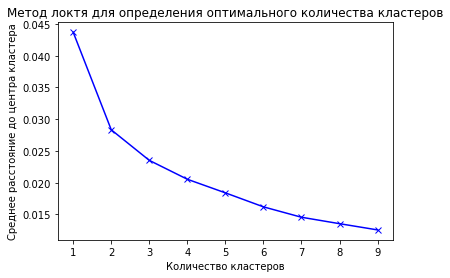

In [224]:
import matplotlib.pyplot as plt
plt.plot(K, distortions, 'bx-')
plt.xlabel('Количество кластеров')
plt.ylabel('Среднее расстояние до центра кластера')
plt.title('Метод локтя для определения оптимального количества кластеров')
plt.show()

Визуальный анализ графика подсказывает, что необходимо использовать 4 кластера, поскольку именно на этом количестве кластеров изменение среднего расстояния внутри кластеров до его центра перестаёт убывать на значительные величины. 

In [38]:
kmeans = KMeans(n_clusters=4, random_state=0)
draw_clustered_map(data, kmeans.fit_predict(coord))

In [13]:
from sklearn.cluster import DBSCAN
clustering = DBSCAN(eps=3, min_samples=2).fit(X)
clustering.labels_

array([0, 0, 0, ..., 0, 0, 0])

In [40]:
draw_clustered_map(data, DBSCAN(eps=0.005, min_samples=10).fit(coord).labels_)

Теперь попробуем спектральную кластеризацию

In [59]:
graph_clustering = GraphClustering(n_clusters=10)
labels = graph_clustering.fit_predict(adjacency_matrix)
draw_clustered_map(data, labels)

Проинтерпретируйте полученные результаты. Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:** Очевидно, что k-means хорош в поиске кластеров только тогда, когда мы примерно знаем структуру наших данных, представляем сколько кластеров там должно быть и знаем, что между всеми выбранными k кластерами есть достаточно значительное расстояние, причём их можно разделить линейно. В нашем случае для кластеризации маршрутов автобусов такого нет, поэтому мы видим какие-то неинтерпретируемые кластеры, которые не содержат в себе никакого глубинного смысла.

В свою очередь, DBSCAN может найти кластеры любой формы и не требует количества кластеров в качестве гиперпараметра, также достаточно устойчив к выбросам, кластеризуя их в отдельный класс шумовых наблюдений. Однако если мы имеем дело с кластерами разной плотности, то всё будет достаточно плохо, потому что именно эта характеристика отношений между наблюдениями берётся этим алгоритмом для проведения процедуры кластеризации, из-за чего будет сложно выбрать нормальное значение гиперпараметра окрестности эпсилон. На данной задаче видно, что DBSCAN действительно достаточно неплохо пытается выявить маршруты автобусов в центре Москвы, но без оптимального подбора гиперпараметров достаточно проблематично решить эту задачу хотя бы на 50% верно.

Говоря о спектральной кластеризации, то тут следует сказать о вычислительной сложности метода, необходимости хранить матрицу смежности между объектами. В целом, этот подход является одним из наиболее мощных, являясь надстройкой над обычным k-means. Мне кажется, что именно он должен быть применён в задаче кластеризации автобусных остановок, позволяя дать содержательные комментарии о характере кластеров в виде маршрутов автобусов. Но не в моём случае, потому что я опять налажал с реализацией алгоритма и не смог пофиксить ошибки )))

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [3]:
data1 = pd.read_csv('bbc-news-data.csv', sep='\t')
data1.sample(5)

,category,filename,title,content
1289,politics,394.txt,Economy focus for election battle,Britain's economic future will be at the hear...
1872,tech,049.txt,Domain system scam fear,A system to make it easier to create website ...
1044,politics,149.txt,Blair returns from peace mission,Prime Minister Tony Blair has arrived back fr...
654,entertainment,145.txt,Sir Paul rocks Super Bowl crowds,Sir Paul McCartney wowed fans with a live min...
134,business,135.txt,Feta cheese battle reaches court,A row over whether only Greece should be allo...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [4]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [5]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [6]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [7]:
data1['raw_text'] = data1.apply(lambda row: row.title + row.content, axis=1)
data1['text'] = data1.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [8]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

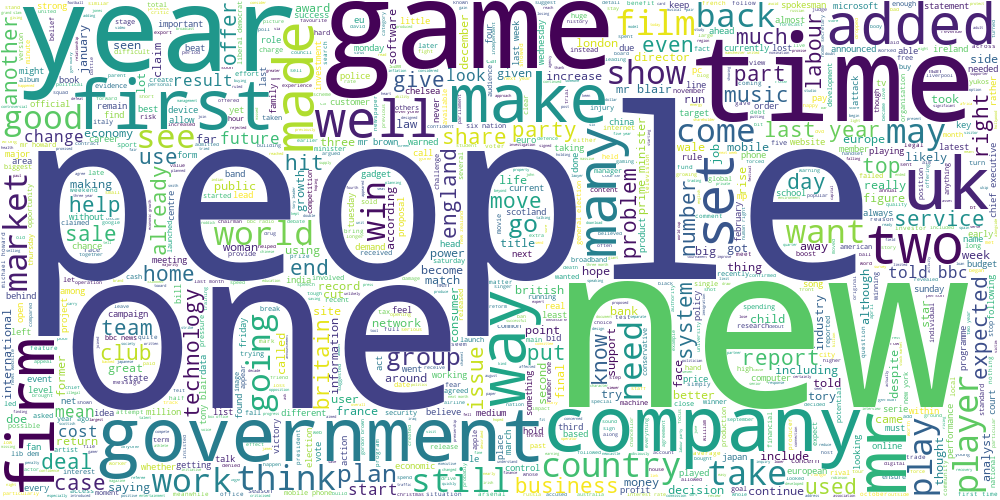

In [9]:
draw_wordcloud(data1.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:**

In [10]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(data1['text'])

In [50]:
X

<2225x24204 sparse matrix of type '<class 'numpy.float64'>'
	with 316328 stored elements in Compressed Sparse Row format>

In [51]:
kmeans = KMeans(n_clusters=8, random_state=0).fit(X)
kmeans.labels_

array([1, 2, 1, ..., 7, 7, 5], dtype=int32)

In [62]:
data1['labels'] = kmeans.labels_

In [66]:
pd.unique(data1['labels'])

array([1, 2, 7, 4, 6, 5, 0, 3], dtype=int32)

Через цикл не получалось выводить облака слов, поэтому будем делать по-чёрному:

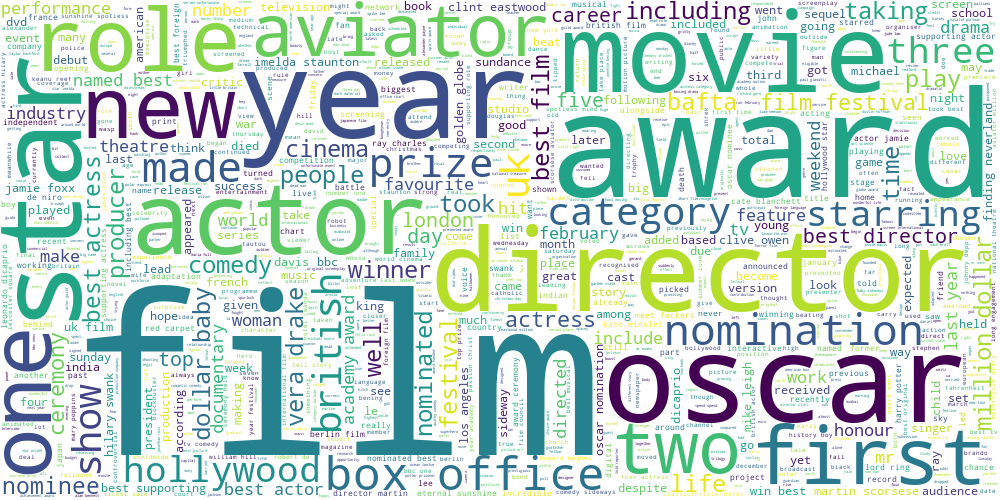

In [70]:
draw_wordcloud(data1[data1['labels']==0].text)

Кажется, нулевой кластер относится к новостям, связанным с кинематографом.

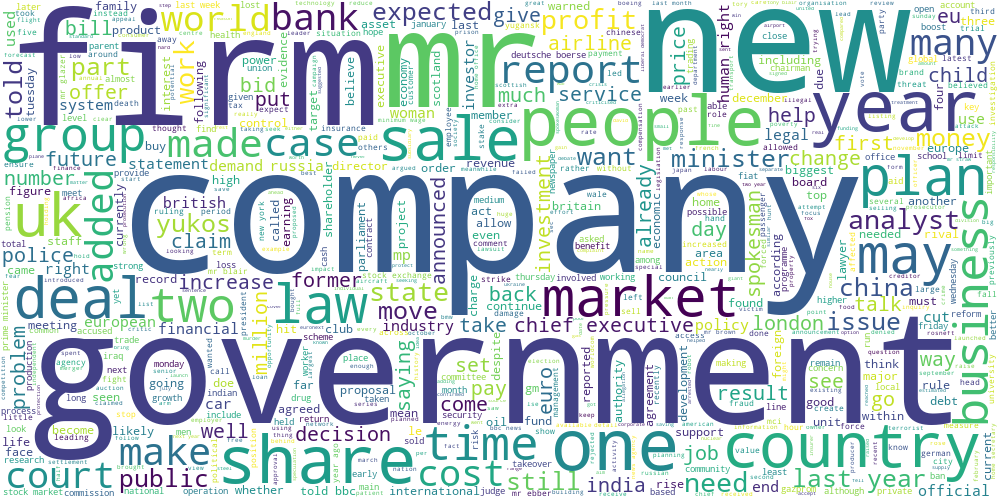

In [72]:
draw_wordcloud(data1[data1['labels']==1].text)

Кластер под номером 1 связан с бизнесом и политикой.

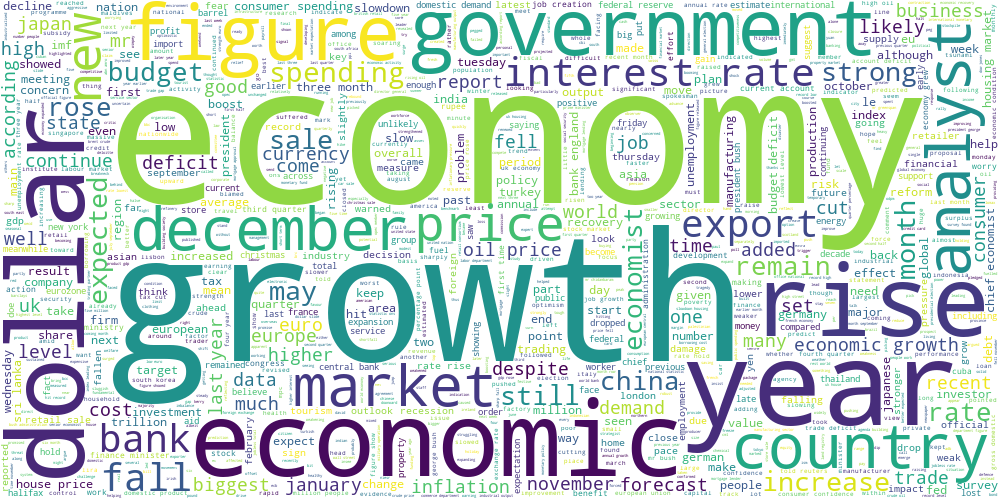

In [73]:
draw_wordcloud(data1[data1['labels']==2].text)

Кластер под номером 2 концентрируется на экономике и финансах.

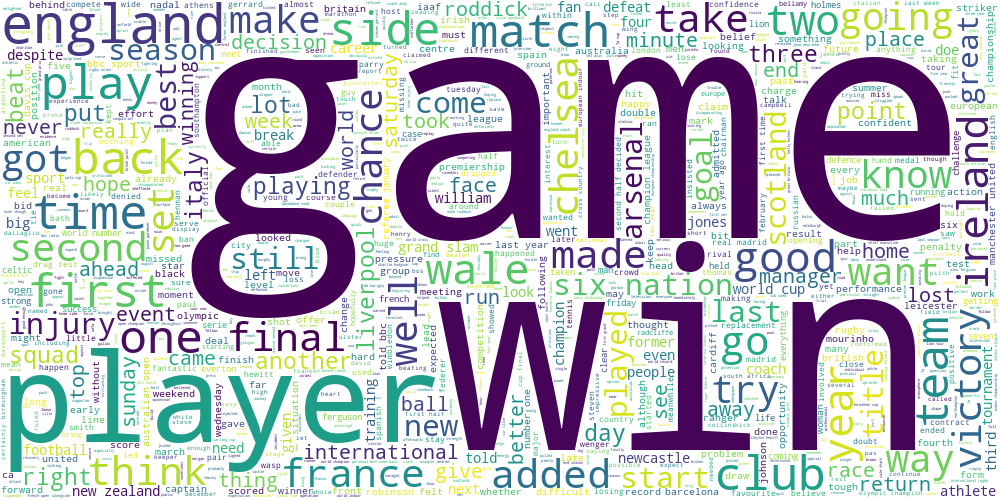

In [74]:
draw_wordcloud(data1[data1['labels']==3].text)

Кластер выше концентрируется на спорте.

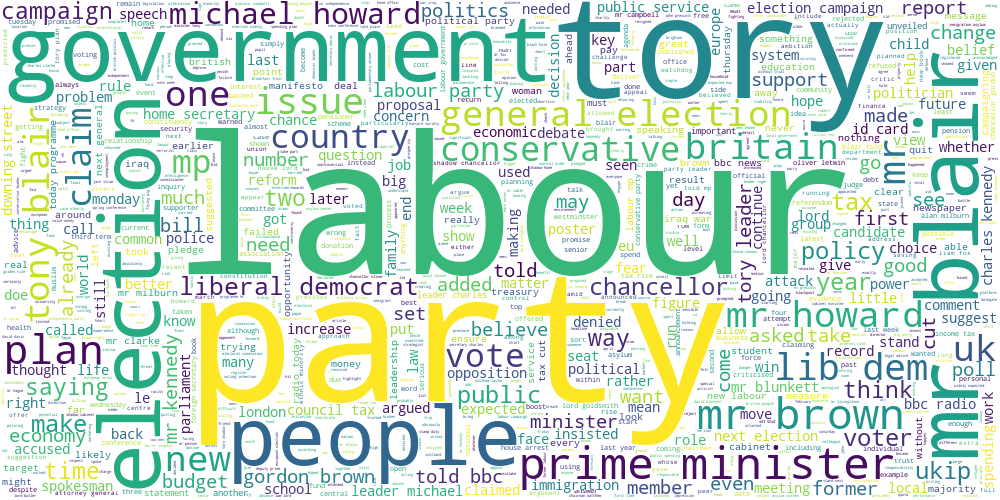

In [75]:
draw_wordcloud(data1[data1['labels']==4].text)

Кластер под номером 4 описывает связанные с политикой новости.

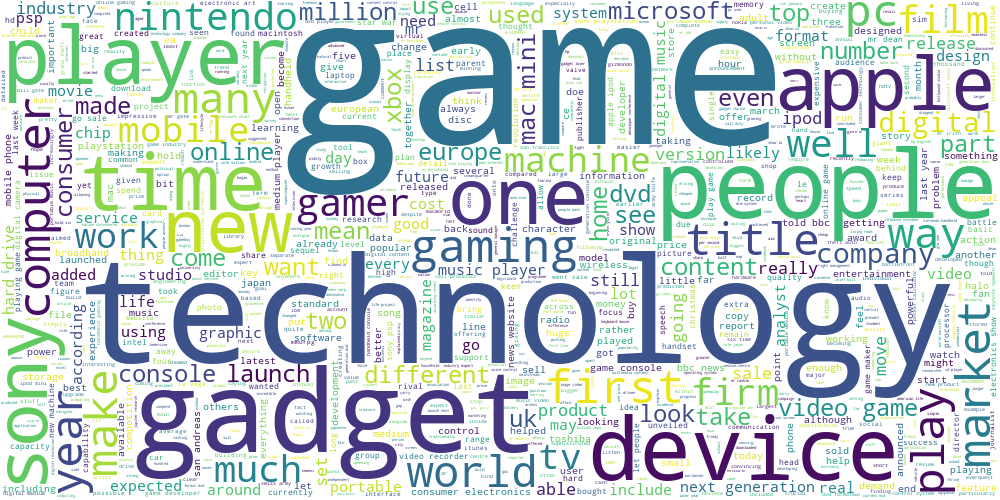

In [76]:
draw_wordcloud(data1[data1['labels']==5].text)

Кластер под номером 5 содержит в себе новости, связанные с современными технологиями и играми.

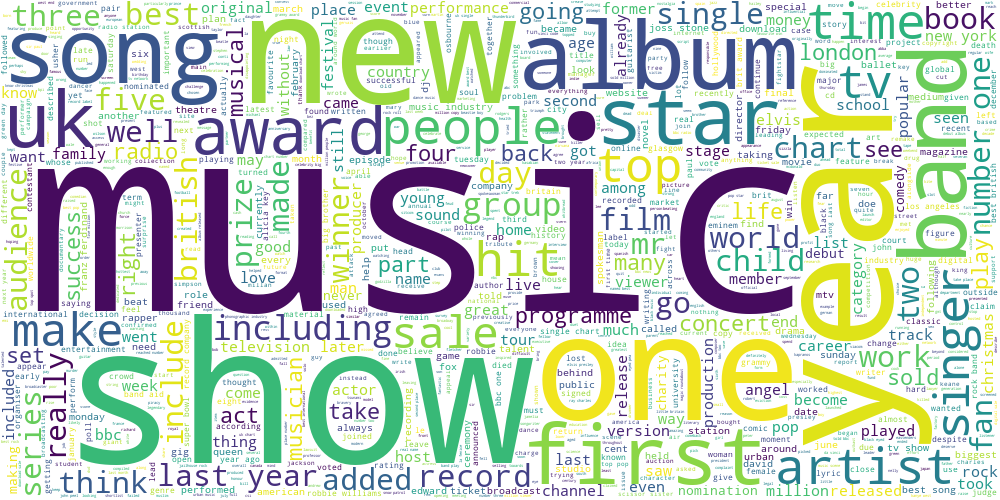

In [77]:
draw_wordcloud(data1[data1['labels']==6].text)

Предпоследний кластер описывает сферу искусства (но не кинематограф).

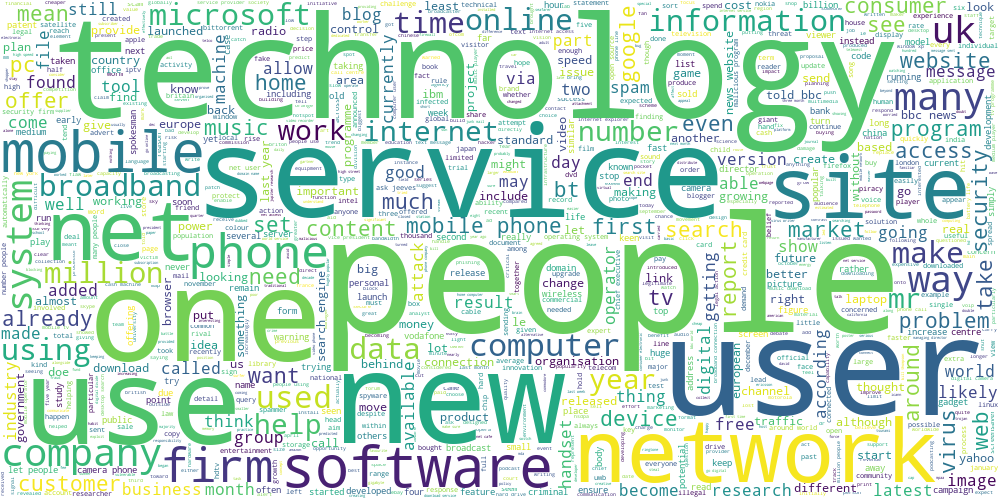

In [78]:
draw_wordcloud(data1[data1['labels']==7].text)

И, наконец, последний кластер то ли также описывает современные технологии и интернет, то ли просто содержит в себе какой-то мусор.

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны. Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:**

In [90]:
kmeans.cluster_centers_[:, 14000]

array([0.00091434, 0.00235099, 0.00070055, 0.        , 0.00046434,
       0.02774687, 0.        , 0.05767673])

In [96]:
center_word_idx = [0]*kmeans.cluster_centers_.shape[0]
for i in range(kmeans.cluster_centers_.shape[0]):
  center_word_idx[i] = np.argmax(kmeans.cluster_centers_[i], axis=0)

In [99]:
X

<2225x24204 sparse matrix of type '<class 'numpy.float64'>'
	with 316328 stored elements in Compressed Sparse Row format>

In [106]:
for i in range(kmeans.cluster_centers_.shape[0]):
  print(vectorizer.get_feature_names()[center_word_idx[i]])

film
mr
economy
game
mr
game
music
mobile


Действительно, если восстановить названия кластеров, данные в прошлом пункте, то получается, что ключевые слова, находящиеся в центре кластеров, значительно коррелируют с описанным:


1.   Кинематограф - film
2.   Бизнес и политика - mr
3. Экономика и финансы - economy
4.   Спорт - game
5. Политика - mr
6. Современные технологии и игры - game
7. Искусство и музыка - music
8. Интернет и современные технологии - mobile




**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [15]:
kmeans = KMeans(n_clusters=4, random_state=0).fit(X)

In [16]:
from sklearn.cluster import SpectralClustering
spectral_clustering = SpectralClustering(n_clusters=4, assign_labels="discretize", random_state=0).fit(X)

In [17]:
DBSCAN_clustering = DBSCAN(eps=1.285).fit(X)

In [18]:
np.unique(DBSCAN_clustering.labels_)

array([-1,  0,  1,  2,  3])

Подобрал вручную так, чтобы было 4 нормальных кластера и один шумовой.

In [19]:
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=2).fit_transform(X)

In [35]:
names = np.array(['K-Means', 'Spectral', 'DBSCAN'])

In [ ]:
for g in np.unique(kmeans.labels_):
    ix = np.where(kmeans.labels_ == g)
    ax.scatter(X_embedded[:,0][ix], X_embedded[:,1][ix], label = g, s = 100)

In [28]:
np.array([kmeans.labels_, DBSCAN_clustering.labels_, spectral_clustering.labels_]).T.shape

(2225, 3)

In [33]:
X_embedded_vis = np.append(X_embedded, np.array([kmeans.labels_, DBSCAN_clustering.labels_, spectral_clustering.labels_]).T, axis=1)

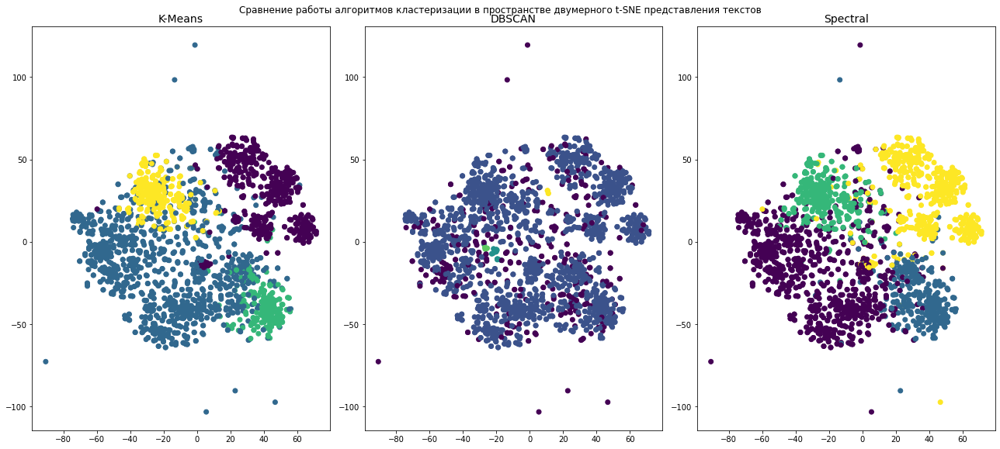

In [60]:
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 8))
fig.suptitle('Сравнение работы алгоритмов кластеризации в пространстве двумерного t-SNE представления текстов', y=1)
ax1.scatter(X_embedded[:,0], X_embedded[:,1], c = X_embedded_vis[:,2])
ax1.set_title(names[0], size=14)
ax2.scatter(X_embedded[:,0], X_embedded[:,1], c = X_embedded_vis[:,3])
ax2.set_title(names[2], size=14)
ax3.scatter(X_embedded[:,0], X_embedded[:,1], c = X_embedded_vis[:,4])
ax3.set_title(names[1], size=14)

fig.tight_layout()

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:** Как видим, DBSCAN наложил два кластера один на другой, ужав до минимума три оставшихся, даже не понять, какой из них шумовой. Очевидно, для решения задачи кластеризации текстов этот алгоритм не самый лучший.

В свою очередь, даже на 4 кластерах видно, что k-means достаточно неплохо кластеризует признаки в пространстве t-SNE представления. 

Тогда как спектральная кластеризация ведёт себя примерно аналогично k-means, хотя следует отметить, что этот алгоритм относит аномальные точки в пространстве двух главных компонент t-SNE представления к разным кластерам, что, наверное не особо хорошо, если вспомнить о принципе Rag-bag (все мусорные точки должны быть в одном кластере и не портить остальные).

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means. Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:**

In [62]:
from sklearn.decomposition import LatentDirichletAllocation
lda = LatentDirichletAllocation(n_components=8*3, random_state=0)

In [67]:
from sklearn.feature_extraction.text import CountVectorizer
bow = CountVectorizer()
X_bow = bow.fit_transform(data1['text'])

In [68]:
X_bow

<2225x24204 sparse matrix of type '<class 'numpy.int64'>'
	with 316328 stored elements in Compressed Sparse Row format>

In [70]:
X_lda = lda.fit_transform(X_bow)

In [73]:
data1['lda_labels'] = np.argmax(X_lda, axis=1)

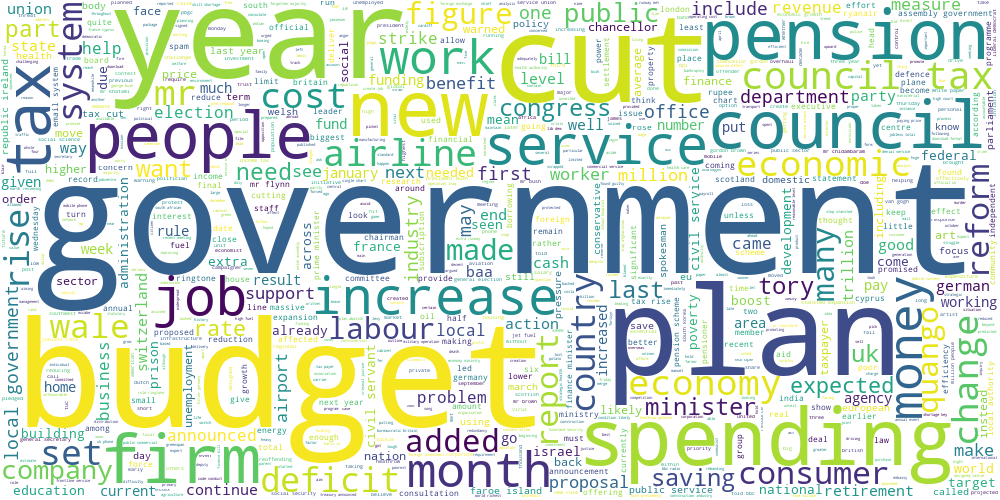

In [76]:
draw_wordcloud(data1[data1['lda_labels']==1].text)

В соответствии с моделью латентного размещения Дирихле этот кластер соответствует связанным с макроэкономикой новостям.

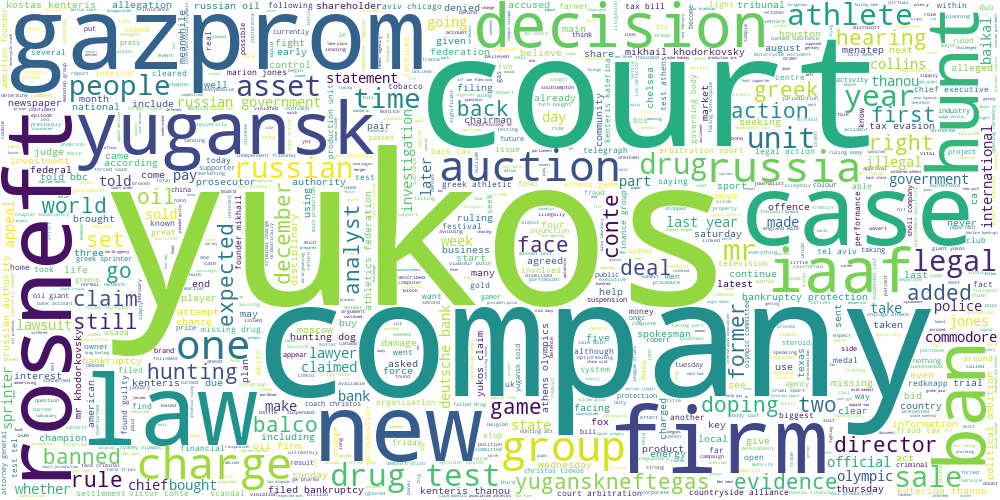

In [77]:
draw_wordcloud(data1[data1['lda_labels']==21].text)

Данный кластер связан с новостями про рынок нефти.

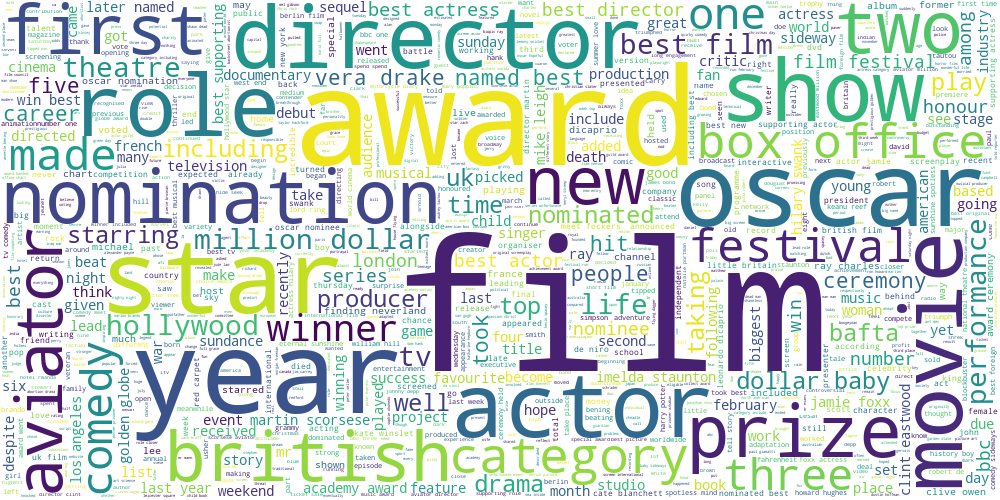

In [80]:
draw_wordcloud(data1[data1['lda_labels']==13].text)

Этот кластер, как и в случае k-means, про фильмы и кинематограф.

Вообще говоря, предложенный в данном пункте метод, кажется, работает похуже, чем k-means, поскольку в некоторых непредставленных в работе облаках тегов для LDA в качестве ключевых слов выделились какие-то будто бы вообще не связные между собой слова. Однако этот алгоритм, видимо, хорош для выделения более узких тем.

## Часть 3. Transfer learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [95]:
y = data1['category']

In [96]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=0)

In [97]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
clf = LogisticRegression(random_state=0).fit(X_train, y_train)
y_pred = clf.predict(X_test)
accuracy_score(y_pred, y_test)

0.9696629213483146

Видим, что логистическая регрессия на TF-IDF представлениях обучается достаточно хорошо. Запомним это.

In [98]:
kmeans = KMeans(n_clusters=8, random_state=0).fit(X)
kmeans.labels_

array([1, 2, 1, ..., 7, 7, 5], dtype=int32)

Чтобы получить расстояние до центра кластера в качестве признака для логрегрессии, возьмём код [отсюда](https://stackoverflow.com/questions/54240144/distance-between-nodes-and-the-centroid-in-a-kmeans-cluster).

In [100]:
X_dist = kmeans.transform(X)**2
df = pd.DataFrame(X_dist.sum(axis=1).round(2), columns=['sqdist'])
df['label'] = kmeans.labels_
df.head()

,sqdist,label
0,8.27,1
1,8.05,2
2,8.39,1
3,8.31,1
4,8.47,1


In [103]:
X_dist = np.reshape(np.array(df['sqdist']), (-1, 1))
X_train, X_test, y_train, y_test = train_test_split(X_dist, y, test_size=0.4, random_state=0)
clf = LogisticRegression(random_state=0).fit(X_train, y_train)
y_pred = clf.predict(X_test)
accuracy_score(y_pred, y_test)

0.2853932584269663

Вполне логично, что данная модель отработала на порядок хуже обычной логистической регрессии на tf-idf представлениях, поскольку в задании 2 мы видели, что в целом перед нами кластеры схожей плотности, среди которых нельзя выявить каких-то существенных разнородных по плотности категорий. Именно поэтому модель не смогла выявить какие-то закономерности в расстояниях до центров кластеров, выдавая везде что-то около константы/рандома (4 класса и точность $\sim$ 0.25)

Теперь попробуем обучить латентные размещения Дирихле.

In [104]:
X_train, X_test, y_train, y_test = train_test_split(X_lda, y, test_size=0.4, random_state=0)
clf = LogisticRegression(random_state=0).fit(X_train, y_train)
y_pred = clf.predict(X_test)
accuracy_score(y_pred, y_test)

0.9

Эта модель, схожая по своей сущности с первой, выдала качество на порядок лучше предыдущей сумасбродной модели, но всё же хуже обычной логрегрессии на tfidf. Видимо, это связано с тем, что мы выбрали число компонент, значительно превосходящее истинное количество категорий в разметке.

У какой модели получилось лучшее качество? С чем это связано?

**Ответ:** Логистическая регрессия на tf-idf признаках выдала наилучший результат, поскольку мы уже выяснили через визуализацию результатов k-means, что он достаточно хорошо разделяет тексты между собой (пускай и в пространстве двух главных компонент t-SNE). В свою очередь, другие модели использовали несколько другие предпосылки, которые не оправданы в данном задании.

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 

1. Разбить обучающую выборку на размеченный трейн, неразмеченный трейн и валидацию
  
*     Разобьём обучающую выборку на трейн (70%) и валидацию (30%)

*   Разобьём трейн на неразмеченный (65/70) и размеченный трейн (5/70)

2. На трейне обучить векторайзеры и кластеризацию
3. Обучить логрегу на размеченном трейне
4. Подобрать гиперпараметры векторайзеров и кластеризаций на валидации
5. Оценить качество на 40% тестовой выборки.

In [107]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(data1['text'])

from sklearn.preprocessing import LabelEncoder
enc = LabelEncoder()
y_digits = enc.fit_transform(np.reshape(np.array(data1['category']), (-1, 1)))

/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:251: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [120]:
X_train, X_test, y_train, y_test = train_test_split(X, y_digits, random_state=0)
X_subtrain, X_val, y_subtrain, y_val = train_test_split(X_train, y_train, test_size=0.3, random_state=0)
X_labeled, X_unlabeled, y_labeled, y_unlabeled = train_test_split(X_subtrain, y_subtrain, test_size=13/14, random_state=0)

Обучим tf-idf векторайзер для логрегрессии

In [123]:
clf = LogisticRegression(random_state=0).fit(X_labeled, y_labeled)
y_pred = clf.predict(X_test)
accuracy_score(y_pred, y_test)

0.35727109515260325

Без кросс-валидации на задаче четырёхклассовой классификации логистическая регрессия на tf-idf представлениях выдала результат, весьма близкий к рандому. Это можно понять, поскольку для обучения у нас есть всего 5%*75%=3,75% от всей выборки.

Попробуем подобрать гиперпараметры для логистической регрессии, воспользовавшись кодом [отсюда](https://machinelearningmastery.com/hyperparameters-for-classification-machine-learning-algorithms/#:~:text=Logistic%20regression%20does%20not%20really,with%20different%20solvers%20(solver).&text=Regularization%20(penalty)%20can%20sometimes%20be%20helpful.).

In [124]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]
# define grid search
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=clf, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_val, y_val)

In [126]:
grid_result.best_params_

{'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}

In [128]:
clf = LogisticRegression(solver='newton-cg', penalty='l2', C=100,random_state=0).fit(X_labeled, y_labeled)
y_pred = clf.predict(X_test)
accuracy_score(y_pred, y_test)

0.8061041292639138

Видим, что после подбора гиперпараметров качество подскочило в несколько раз, почти догнав lda на 60% размеченных данных.

Теперь перейдём к обучению модели "K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров"

In [156]:
kmeans = KMeans(n_clusters=8, random_state=0).fit(X_subtrain)

In [158]:
X_dist = kmeans.transform(X_subtrain)**2
df = pd.DataFrame(X_dist.sum(axis=1).round(2), columns=['sqdist'])
df['label'] = kmeans.labels_

In [161]:
X_dist = np.reshape(np.array(df['sqdist']), (-1, 1))
X_train, X_test, y_train, y_test = train_test_split(X_dist, y_subtrain, test_size=0.4, random_state=0)
clf = LogisticRegression(random_state=0).fit(X_train, y_train)
y_pred = clf.predict(X_test)
accuracy_score(y_pred, y_test)

0.31905781584582443

По-моему, в этой модели я сильно запутался с этими шагами по обучению полуразмеченной выборки... Какие иксы на какой стадии убирать/добавлять не разобрался.

Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:** Очевидно, что при сокрытии огромного количества полезной информации, которую мы раньше использовали для обучения, качество должно было ухудшиться. Однако благодаря кросс-валидации гиперпараметров моделей у нас получилось сгладить это ухудшение, причём значительно (0.96 на логрегрессии на tf-idf представлениях текстов ухудшилось лишь до 0.81)

## Бонус

**Задание 4 (1 балл)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [141]:
from sklearn.semi_supervised import LabelSpreading
label_prop_model = LabelSpreading()

Нам необходимо дать метку -1 якобы неразмеченным данным.

In [137]:
X_labeled, X_unlabeled, y_labeled, y_unlabeled = train_test_split(X_train, y_train, test_size=0.65, random_state=0)
y_unlabeled = [-1 for i in y_unlabeled]

In [ ]:
y_unlabeled

In [146]:
from scipy.sparse import vstack
X_semi_train = vstack([X_labeled, X_unlabeled]).toarray()
y_semi_train = np.concatenate((y_labeled, np.array(y_unlabeled)), axis=0)

In [147]:
X_semi_train

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [148]:
label_prop_model.fit(X_semi_train, list(y_semi_train))

LabelSpreading(alpha=0.2, gamma=20, kernel='rbf', max_iter=30, n_jobs=None,
               n_neighbors=7, tol=0.001)

In [149]:
y_pred = label_prop_model.predict(X_test)
accuracy_score(y_pred, y_test)

0.9228007181328546

Видим, что встроенный алгоритм semi-supervised метода из Sklearn выдал нам лучшие результаты, чем те, что мы получили при реализации своих моделей из основной части задания.

In [153]:
from sklearn.semi_supervised import SelfTrainingClassifier
self_training_model = SelfTrainingClassifier(LogisticRegression(solver='newton-cg', penalty='l2', C=100,random_state=0))
self_training_model.fit(X_semi_train, list(y_semi_train))

ImportError: ignored

In [ ]:
y_pred = self_training_model.predict(X_test)
accuracy_score(y_pred, y_test)

Не получилось проверить второй подход из sklearn в силу неожиданных трудностей за несколько минут до дедлайна. Но я думаю, что код и результат должны были получиться похожими :)

Поставьте, пожалуйста, полный балл за этот бонус... Хочется закрыть позор с первым дз...

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***. 

Звучит страшно интересно и страшно долго...

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (1e-100 балла)**. Опишите свои ощущения от этой домашки, поощряется сравнение с предыдущей.

В начале я говорил о важности как можно более раннего приступления к домашке, да? На эту дз я выделил ещё на пару дней меньше, чем в прошлый раз, поэтому кажется, что рою себе всё более глубокую могилу на этом курсе...

Но кажется, что эта домашка была значительно легче и интереснее. Хоть я и полный дилетант в Питоне, было прикольно попытаться реализовать имеющийся в голове усвоенный алгоритм с лекций и проверить его качество относительно изученных ранее методов (прямо как в дз1). Ещё был неприятно удивлён, когда только после мягкого дедлайна осознал, что задания из второй части дз весят примерно столько же, а реализуются примерно в 20 раз быстрее. Видимо, в следующий раз надо полностью читать домашку на предмет лёгкой добычи..